In [1]:
from pathlib import Path
from glob import glob

import cartopy.crs as ccrs
import iris
from IPython.display import HTML, clear_output
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import matplotlib.colors as mcolors
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import scipy.ndimage as ndimage
import xarray as xr
import xesmf as xe

from mcs_prime import mcs_prime_config_util as cu

/home/users/mmuetz/projects/mcs_prime/mcs_prime/mcs_prime_config_util.py:69: UserWarning: Warning: path missing era5dir: /does/not/exist
  warnings.warn(f"Warning: path missing {k}: {path}")


In [2]:
datadir = cu.PATHS['datadir']
simdir = datadir / 'UM_sims'

In [3]:
ens = {
    'ctrl': {},
    'vanillaMCSP': {},
    'stochMCSP': {},
}

for i in range(8):
    print('ctrl', i)
    dsa = xr.open_dataset(str(simdir / f'zhixiao_mirror/ens_um/pa_um_off/englaa_pa000_em{i}.iris.nc'))
    pflux = dsa.precipitation_flux
    pflux = pflux.rename(time_0='time')
    pflux_tropics = pflux.isel(latitude=slice(108, 216), time=slice(0, 20))
    # convert from kg m-2 s-1 to mm h-1
    pflux_tropics.values = pflux_tropics.values * 3600
    pflux_tropics.attrs['units'] = 'mm h-1'
    ens['ctrl'][f'em{i}'] = pflux_tropics
    
for i in range(8):
    print('vanillaMCSP', i)
    dsa = xr.open_dataset(str(simdir / f'zhixiao_mirror/ens_um_corrected/pa_um_on/englaa_pa000_em{i}.iris.nc'))
    pflux = dsa.precipitation_flux
    pflux = pflux.rename(time_0='time')
    pflux_tropics = pflux.isel(latitude=slice(108, 216), time=slice(0, 20))
    # convert from kg m-2 s-1 to mm h-1
    pflux_tropics.values = pflux_tropics.values * 3600
    pflux_tropics.attrs['units'] = 'mm h-1'
    ens['vanillaMCSP'][f'em{i}'] = pflux_tropics
    
for i in range(8):
    print('stochMCSP', i)
    dsa = xr.open_dataset(str(simdir / f'u-dg135/share.2-day_sims/cycle/20200701T0000Z/engl/um/em{i}/englaa_pa000.iris.nc'))
    pflux = dsa.precipitation_flux
    pflux = pflux.rename(time_0='time')
    pflux_tropics = pflux.isel(latitude=slice(108, 216), time=slice(0, 20))
    # convert from kg m-2 s-1 to mm h-1    
    pflux_tropics.values = pflux_tropics.values * 3600
    pflux_tropics.attrs['units'] = 'mm h-1'    
    ens['stochMCSP'][f'em{i}'] = pflux_tropics
    


ctrl 0
ctrl 1
ctrl 2
ctrl 3
ctrl 4
ctrl 5
ctrl 6
ctrl 7
vanillaMCSP 0
vanillaMCSP 1
vanillaMCSP 2
vanillaMCSP 3
vanillaMCSP 4
vanillaMCSP 5
vanillaMCSP 6
vanillaMCSP 7
stochMCSP 0
stochMCSP 1
stochMCSP 2
stochMCSP 3
stochMCSP 4
stochMCSP 5
stochMCSP 6
stochMCSP 7


In [4]:


DATADIR = cu.PATHS['datadir']
IMERG_FINAL_30MIN_DIR = DATADIR / 'GPM_IMERG_final/30min'
# Just load IMERG on the hour "S??0000".
paths = sorted(glob(str(IMERG_FINAL_30MIN_DIR / '2020/07/01/*-S??0000-*.nc4')))

In [5]:
ds_imerg = xr.open_mfdataset(paths)

In [6]:
imerg_precip = ds_imerg.precipitation

In [7]:
imerg_precip.attrs

{'DimensionNames': 'time,lon,lat',
 'Units': 'mm/hr',
 'units': 'mm/hr',
 'CodeMissingValue': '-9999.9',
 'LongName': '\nComplete merged microwave-infrared (gauge-adjusted)\n                        precipitation estimate;  formerly precipitationCal\n',
 'origname': 'precipitation',
 'fullnamepath': '/Grid/precipitation',
 'coordinates': 'Grid_time Grid_lon Grid_lat'}

In [8]:
# Regrid OBS
# pflux.cf has no bounds, meaning conservative regridding won't work for now
# Perform conservative regridding
# regridder = xe.Regridder(gpcp.satellite_precip, pflux, method='conservative')
regridder = xe.Regridder(imerg_precip, pflux, method='bilinear')
regridded_imerg = regridder(imerg_precip)

/home/users/mmuetz/miniconda3/envs/mcs_prime_env/lib/python3.10/site-packages/dask/array/core.py:456: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  o = func(*args, **kwargs)
/home/users/mmuetz/miniconda3/envs/mcs_prime_env/lib/python3.10/site-packages/xarray/core/dataarray.py:780: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  return key in self.data
/home/users/mmuetz/miniconda3/envs/mcs_prime_env/lib/python3.10/site-packages/xarray/core/dataarray.py:780: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  return key in self.data


In [9]:
imerg = regridded_imerg.isel(latitude=slice(108, 216), time=slice(4, 24))

In [10]:
dlon = imerg.longitude.values[1] - imerg.longitude.values[0]
dlat = imerg.latitude.values[1] - imerg.latitude.values[0]
print(dlon, dlat)

0.8333334 0.55555344


In [11]:
imerg

<xarray.DataArray (time: 20, latitude: 108, longitude: 432)>
dask.array<getitem, shape=(20, 108, 432), dtype=float32, chunksize=(1, 108, 432), chunktype=numpy.ndarray>
Coordinates:
  * time       (time) object 2020-07-01 04:00:00 ... 2020-07-01 23:00:00
  * longitude  (longitude) float32 0.4167 1.25 2.083 2.917 ... 357.9 358.7 359.6
  * latitude   (latitude) float32 -29.72 -29.17 -28.61 ... 28.61 29.17 29.72
Attributes:
    regrid_method:  bilinear

In [12]:
# colors = ['#800080', '#0000FF', '#6495ED', '#7FFFD4', '#66CDAA', '#32CD32', '#ADFF2F', '#FFFF99', '#FFD700', '#FFA500', '#FF4500', '#800080']
colors = ['#FFFFFF', '#0000FF', '#6495ED', '#7FFFD4', '#66CDAA', '#32CD32', '#ADFF2F', '#FFFF99', '#FFD700', '#FFA500', '#FF4500', '#800080']
# Create a custom colormap
cmap = mcolors.ListedColormap(colors)

In [13]:
def calc_lon_lst0_lst12(h):
    lon_lst0 = -h * 15
    lon_lst12 = -(h - 12) * 15

    lon_lst0 = (lon_lst0 + 180) % 360 - 180
    lon_lst12 = (lon_lst12 + 180) % 360 - 180
    return lon_lst0, lon_lst12

0


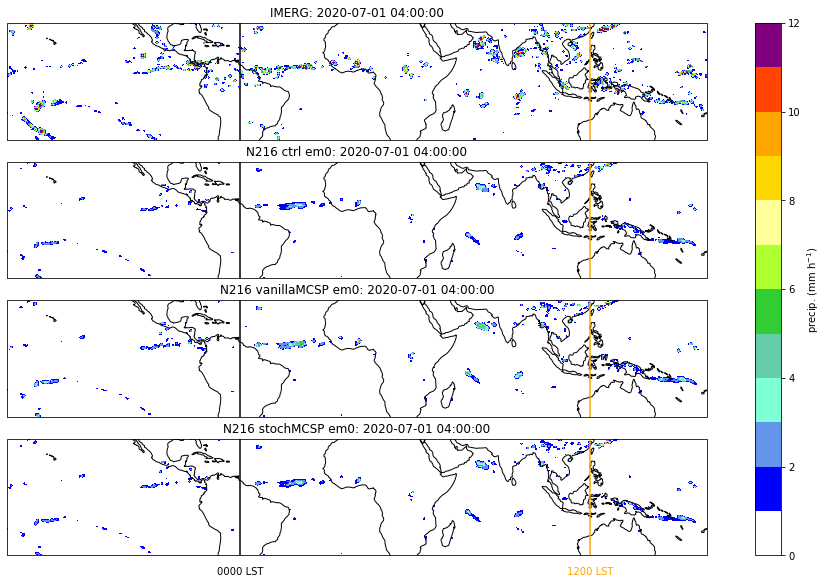

In [22]:
# %%capture
# %%script false --no-raise-error

# Set up the figure, the axis, and the plot element we want to animate
fig, axes = plt.subplots(4, 1, subplot_kw={'projection': ccrs.PlateCarree()}, layout='constrained')
fig.set_size_inches(15, 8)
# Update function for the animation
def plot_imerg_expts(frame):
    print(frame)
    for ax in axes:
        ax.cla()
        ax.coastlines()
        ax.set_ylim((-30, 30))
        
    time = pd.Timestamp(ens['ctrl']['em0'].time[frame].values.item())
    axes[0].contourf(imerg.longitude, imerg.latitude, imerg[frame], levels=np.arange(13), cmap=cmap)
    axes[0].set_title(f'IMERG: {time}')

    for ax, expt in zip(axes[1:], ['ctrl', 'vanillaMCSP', 'stochMCSP']):
        pflux = ens[expt]['em0']
        im = ax.contourf(pflux.longitude, pflux.latitude, pflux[frame], levels=np.arange(13), cmap=cmap)
        ax.set_title(f'N216 {expt} em0: {time}')
    lst0, lst12 = calc_lon_lst0_lst12(time.hour)
    for ax in axes:
        ax.axvline(x=lst0, c='k')
        ax.axvline(x=lst12, c='orange')
        if ax == axes[-1]:
            ax.text(x=lst0, y=-40, s='0000 LST', ha='center')
            ax.text(x=lst12, y=-40, s='1200 LST', ha='center', c='orange')
    return im

im = plot_imerg_expts(0)
plt.colorbar(im, ax=axes, label='precip. (mm h$^{-1}$)') 

In [23]:
fig.set_constrained_layout(False)

# Create the animation object
ani = FuncAnimation(fig, plot_imerg_expts, frames=range(20))
jshtml = ani.to_jshtml()
clear_output()
# Display the animation in the notebook
HTML(jshtml)

0


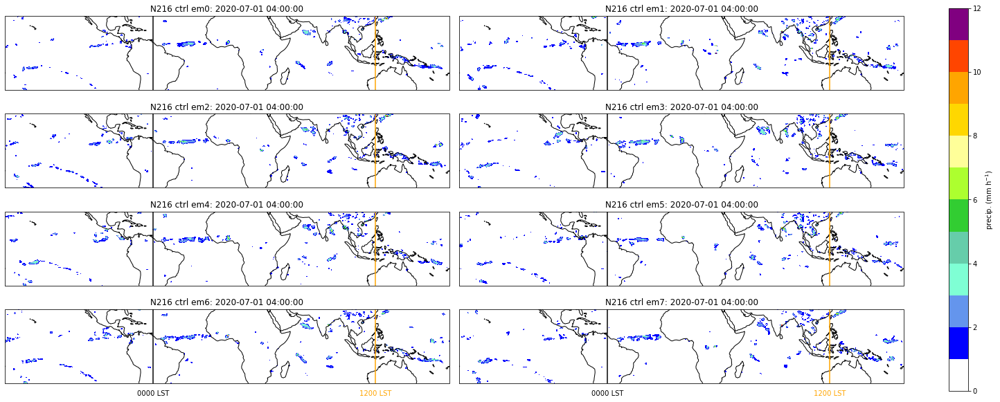

In [30]:
# %%capture
# %%script false --no-raise-error

# Set up the figure, the axis, and the plot element we want to animate
fig, axes = plt.subplots(4, 2, subplot_kw={'projection': ccrs.PlateCarree()}, layout='constrained')
fig.set_size_inches(20, 8)
# Update function for the animation
def plot_expt_ems(expt, frame):
    print(frame)
    for ax in axes.flatten():
        ax.cla()
        ax.coastlines()
        ax.set_ylim((-30, 30))
        
    time = pd.Timestamp(ens['ctrl']['em0'].time[frame].values.item())

    for ax, em in zip(axes.flatten(), [f'em{i}' for i in range(8)]):
        pflux = ens[expt][em]
        im = ax.contourf(pflux.longitude, pflux.latitude, pflux[frame], levels=np.arange(13), cmap=cmap)
        ax.set_title(f'N216 {expt} {em}: {time}')
    lst0, lst12 = calc_lon_lst0_lst12(time.hour)
    for ax in axes.flatten():
        ax.axvline(x=lst0, c='k')
        ax.axvline(x=lst12, c='orange')
        if ax in axes[-1]:
            ax.text(x=lst0, y=-40, s='0000 LST', ha='center')
            ax.text(x=lst12, y=-40, s='1200 LST', ha='center', c='orange')
    return im

im = plot_expt_ems('ctrl', 0)
plt.colorbar(im, ax=axes, label='precip. (mm h$^{-1}$)') 

In [31]:
fig.set_constrained_layout(False)

def plot_closure(frame):
    return plot_expt_ems('ctrl', frame)
# Create the animation object
ani = FuncAnimation(fig, plot_closure, frames=range(20))
jshtml = ani.to_jshtml()
clear_output()
# Display the animation in the notebook
HTML(jshtml)

In [32]:
pflux_vals = np.array([ens[expt][f'em{i}'].values for i in range(8)])
pflux_vals.shape

(8, 20, 108, 432)

0


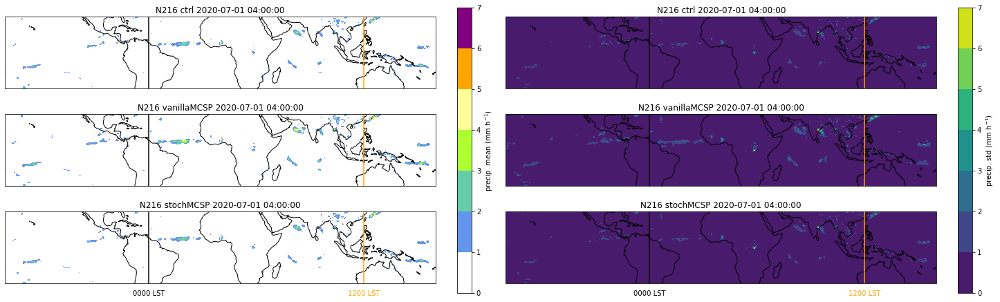

In [56]:
# %%capture
# %%script false --no-raise-error

# Set up the figure, the axis, and the plot element we want to animate
fig, axes = plt.subplots(3, 2, subplot_kw={'projection': ccrs.PlateCarree()}, layout='constrained')
fig.set_size_inches(20, 6)
# Update function for the animation
def plot_ems_mean_std(frame):
    print(frame)
    for ax in axes.flatten():
        ax.cla()
        ax.coastlines()
        ax.set_ylim((-30, 30))
        
    time = pd.Timestamp(ens['ctrl']['em0'].time[frame].values.item())
    pflux0 = ens['ctrl'][f'em0']

    for axrow, expt in zip(axes, ['ctrl', 'vanillaMCSP', 'stochMCSP']):
        # axrow[0].set_ylabel(expt) # doesn't work for cartopy
        axrow[0].set_title(f'N216 {expt} {time}')
        axrow[1].set_title(f'N216 {expt} {time}')
        pflux_vals = np.array([ens[expt][f'em{i}'].values for i in range(8)])
        pflux_mean = pflux_vals.mean(axis=0)
        pflux_std = pflux_vals.std(axis=0)
        
        im0 = axrow[0].contourf(pflux0.longitude, pflux0.latitude, pflux_mean[frame], levels=range(8), cmap=cmap)
        im1 = axrow[1].contourf(pflux0.longitude, pflux0.latitude, pflux_std[frame], levels=range(8))

    lst0, lst12 = calc_lon_lst0_lst12(time.hour)
    for ax in axes.flatten():
        ax.axvline(x=lst0, c='k')
        ax.axvline(x=lst12, c='orange')
        if ax in axes[-1:]:
            ax.text(x=lst0, y=-40, s='0000 LST', ha='center')
            ax.text(x=lst12, y=-40, s='1200 LST', ha='center', c='orange')
    return im0, im1

im0, im1 = plot_ems_mean_std(0)
plt.colorbar(im0, ax=axes[:, 0], label='precip. mean (mm h$^{-1}$)') 
plt.colorbar(im1, ax=axes[:, 1], label='precip. std (mm h$^{-1}$)') 

In [53]:
im0, im1 = plot_ems_mean_std(7)

7


In [54]:
im0, im1 = plot_ems_mean_std(9)

9


In [49]:
fig.set_constrained_layout(False)

# Create the animation object
ani = FuncAnimation(fig, plot_ems_mean_std, frames=range(20))
jshtml = ani.to_jshtml()
clear_output()
# Display the animation in the notebook
HTML(jshtml)

In [ ]:
fig.set_constrained_layout(False)

def plot_closure(frame):
    return plot_expt_ems_mean_std('ctrl', frame)
# Create the animation object
ani = FuncAnimation(fig, plot_closure, frames=range(20))
jshtml = ani.to_jshtml()
clear_output()
# Display the animation in the notebook
HTML(jshtml)

9


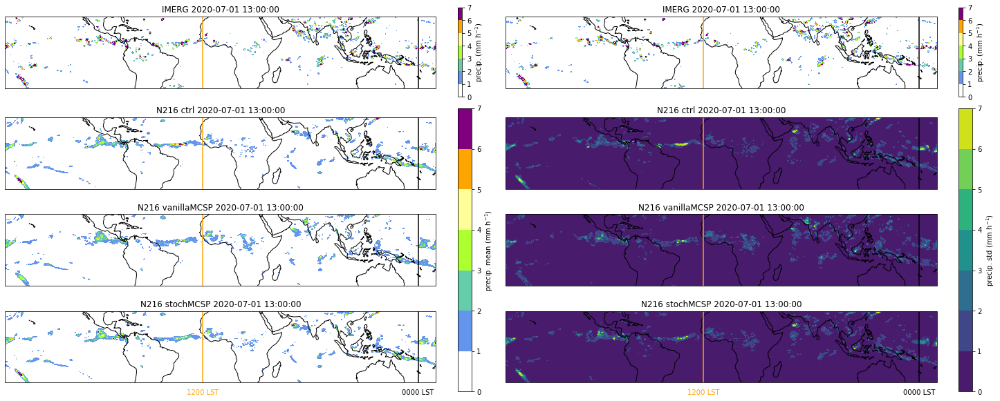

In [64]:
# %%capture
# %%script false --no-raise-error

# Set up the figure, the axis, and the plot element we want to animate
fig, axes = plt.subplots(4, 2, subplot_kw={'projection': ccrs.PlateCarree()}, layout='constrained')
fig.set_size_inches(20, 8)
# Update function for the animation
def plot_imerg_ems_mean_std(frame):
    print(frame)
    for ax in axes.flatten():
        ax.cla()
        ax.coastlines()
        ax.set_ylim((-30, 30))
        
    time = pd.Timestamp(ens['ctrl']['em0'].time[frame].values.item())
    pflux0 = ens['ctrl'][f'em0']
    
    axes[0, 0].set_title(f'IMERG {time}')
    axes[0, 1].set_title(f'IMERG {time}')
    
    im0 = axes[0, 0].contourf(imerg.longitude, imerg.latitude, imerg[frame], levels=range(8), cmap=cmap)
    im1 = axes[0, 1].contourf(imerg.longitude, imerg.latitude, imerg[frame], levels=range(8), cmap=cmap)

    for axrow, expt in zip(axes[1:], ['ctrl', 'vanillaMCSP', 'stochMCSP']):
        # axrow[0].set_ylabel(expt) # doesn't work for cartopy
        axrow[0].set_title(f'N216 {expt} {time}')
        axrow[1].set_title(f'N216 {expt} {time}')
        pflux_vals = np.array([ens[expt][f'em{i}'].values for i in range(8)])
        pflux_mean = pflux_vals.mean(axis=0)
        pflux_std = pflux_vals.std(axis=0)
        
        im0 = axrow[0].contourf(pflux0.longitude, pflux0.latitude, pflux_mean[frame], levels=range(8), cmap=cmap)
        im1 = axrow[1].contourf(pflux0.longitude, pflux0.latitude, pflux_std[frame], levels=range(8))

    lst0, lst12 = calc_lon_lst0_lst12(time.hour)
    for ax in axes.flatten():
        ax.axvline(x=lst0, c='k')
        ax.axvline(x=lst12, c='orange')
        if ax in axes[-1:]:
            ax.text(x=lst0, y=-40, s='0000 LST', ha='center')
            ax.text(x=lst12, y=-40, s='1200 LST', ha='center', c='orange')
    return im0, im1

im0, im1 = plot_imerg_ems_mean_std(9)
plt.colorbar(im0, ax=axes[0, 0], label='precip. (mm h$^{-1}$)') 
plt.colorbar(im0, ax=axes[0, 1], label='precip. (mm h$^{-1}$)') 

plt.colorbar(im0, ax=axes[1:, 0], label='precip. mean (mm h$^{-1}$)') 
plt.colorbar(im1, ax=axes[1:, 1], label='precip. std (mm h$^{-1}$)') 

In [12]:
aspect = 1.43  # mean aspect ratio of cells over the tropics.
# dx / dy.

In [15]:
imerg_filtered = np.zeros((10, *imerg.values.shape))
for i, sigma in enumerate(range(0, 10)):
    print(i)
    imerg_filtered[i] = ndimage.gaussian_filter(imerg.values, (0, aspect * sigma, sigma))
clear_output()

In [16]:
filtered_expt_ens = {}

for expt in ['ctrl', 'vanillaMCSP', 'stochMCSP']:
    filtered_expt_ens[expt] = {}
    print(expt)
    expt_ens = ens[expt]
    
    for i in range(8):
        print(i)
        pflux = expt_ens[f'em{i}']
        pflux_filtered = np.zeros((10, *pflux.values.shape))
        for j, sigma in enumerate(range(0, 10)):
            pflux_filtered[j] = ndimage.gaussian_filter(pflux.values, (0, aspect * sigma, sigma))
        filtered_expt_ens[expt][f'em{i}'] = pflux_filtered

        

ctrl
0
1
2
3
4
5
6
7
vanillaMCSP
0
1
2
3
4
5
6
7
stochMCSP
0
1
2
3
4
5
6
7


In [17]:
def rmse(a1, a2):
    return np.sqrt(np.mean((a1 - a2)**2))

In [18]:
expt_eRMSE = {}
for expt in ['ctrl', 'vanillaMCSP', 'stochMCSP']:

    eRMSE = np.full((8, 20, 10), np.nan)
    for i in range(8):
        print(expt, i)
        pflux_filtered = filtered_expt_ens[expt][f'em{i}']
        for ii in range(10):
            for jj in range(20):
                eRMSE[i, jj, ii] = rmse(imerg_filtered[ii, jj], pflux_filtered[ii, jj])
    expt_eRMSE[expt] = eRMSE

clear_output()

In [19]:
expt_dRMSE = {}
for expt in ['ctrl', 'vanillaMCSP', 'stochMCSP']:

    dRMSE = np.full((8, 8, 20, 10), np.nan)
    for i in range(8):
        for j in range(i + 1, 8):
            print(expt, i, j)
            pflux_filtered1 = filtered_expt_ens[expt][f'em{i}']
            pflux_filtered2 = filtered_expt_ens[expt][f'em{j}']
            for ii in range(10):
                for jj in range(20):
                    dRMSE[i, j, jj, ii] = rmse(pflux_filtered1[ii, jj], pflux_filtered2[ii, jj])
    expt_dRMSE[expt] = dRMSE

clear_output()

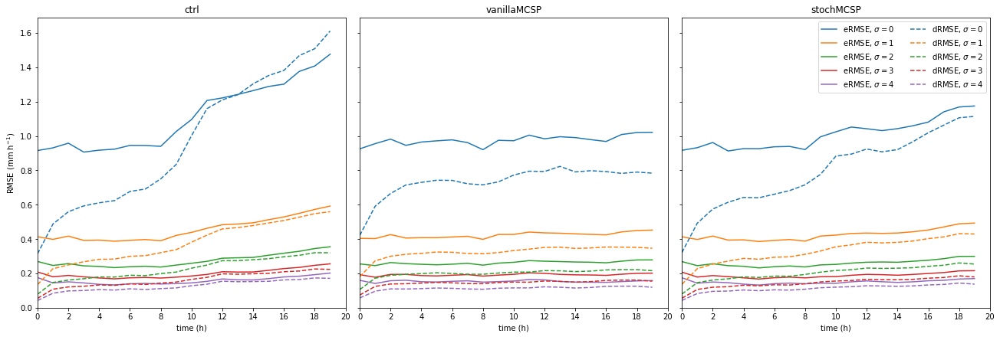

In [21]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True, layout='constrained')
fig.set_size_inches(18, 6)
for ax, expt in zip([ax1, ax2, ax3], ['ctrl', 'vanillaMCSP', 'stochMCSP']):
    ax.set_title(expt)
    dRMSE_ts = np.nanmean(expt_dRMSE[expt], axis=(0, 1))
    eRMSE_ts = np.nanmean(expt_eRMSE[expt], axis=0)
    cs = []
    for i in range(5):
        line, = ax.plot(eRMSE_ts[:, i], label=f'eRMSE, $\sigma=${i}')
        c = line.get_color()
        cs.append(c)
    for i in range(5):
        c = cs[i]
        ax.plot(dRMSE_ts[:, i], ls='--', color=c, label=f'dRMSE, $\sigma=${i}')
    ax.set_xlabel('time (h)')
    ax.set_xticks(np.arange(0, 21, 2))
    ax.set_xlim((0, 20))
    ax.set_ylim((0, None))
ax1.set_ylabel('RMSE (mm h$^{-1}$)')

plt.legend(ncol=2)


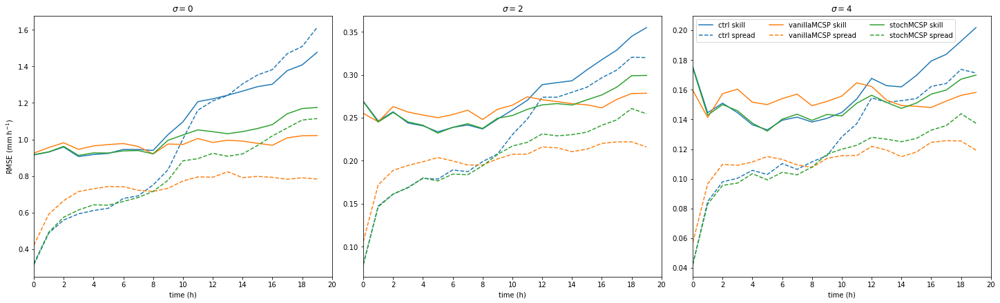

In [32]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, layout='constrained')
fig.set_size_inches(20, 6)
cs = plt.rcParams['axes.prop_cycle'].by_key()['color']

for ax, sigma in zip([ax1, ax2, ax3], [0, 2, 4]):
    ax.set_title(f'$\sigma=${sigma}')
    for i, expt in enumerate(['ctrl', 'vanillaMCSP', 'stochMCSP']):
        dRMSE_ts = np.nanmean(expt_dRMSE[expt], axis=(0, 1))
        eRMSE_ts = np.nanmean(expt_eRMSE[expt], axis=0)
        c = cs[i]
        ax.plot(eRMSE_ts[:, sigma], label=f'{expt} skill')
        ax.plot(dRMSE_ts[:, sigma], ls='--', color=c, label=f'{expt} spread')

        # ax.plot(eRMSE_ts[:, sigma] - dRMSE_ts[:, sigma], ls=':', color=c, label=f'{expt} spread')

    ax.set_xlabel('time (h)')
    ax.set_xticks(np.arange(0, 21, 2))
    ax.set_xlim((0, 20))
    # ax.set_ylim((0, None))
    # ax.axhline(y=0)
ax1.set_ylabel('RMSE (mm h$^{-1}$)')

plt.legend(ncol=3)

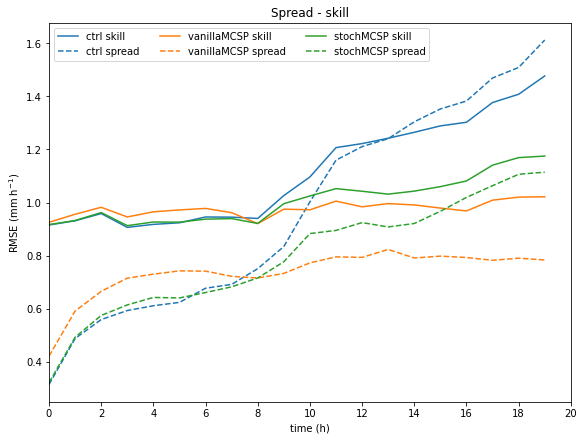

In [33]:
fig, ax1 = plt.subplots(1, 1, sharex=True, layout='constrained')
fig.set_size_inches(8, 6)
cs = plt.rcParams['axes.prop_cycle'].by_key()['color']

for ax, sigma in zip([ax1], [0]):
    ax.set_title(f'Spread - skill')
    for i, expt in enumerate(['ctrl', 'vanillaMCSP', 'stochMCSP']):
        dRMSE_ts = np.nanmean(expt_dRMSE[expt], axis=(0, 1))
        eRMSE_ts = np.nanmean(expt_eRMSE[expt], axis=0)
        c = cs[i]
        ax.plot(eRMSE_ts[:, sigma], label=f'{expt} skill')
        ax.plot(dRMSE_ts[:, sigma], ls='--', color=c, label=f'{expt} spread')

        # ax.plot(eRMSE_ts[:, sigma] - dRMSE_ts[:, sigma], ls=':', color=c, label=f'{expt} spread')

    ax.set_xlabel('time (h)')
    ax.set_xticks(np.arange(0, 21, 2))
    ax.set_xlim((0, 20))
    # ax.set_ylim((0, None))
    # ax.axhline(y=0)
ax1.set_ylabel('RMSE (mm h$^{-1}$)')

plt.legend(ncol=3)

In [ ]:
ens['ctrl']['em0']

In [ ]:
ens['sMCSP']['em0']

In [ ]:


DATADIR = cu.PATHS['datadir']
IMERG_FINAL_30MIN_DIR = DATADIR / 'GPM_IMERG_final/30min'
# Just load IMERG on the hour "S??0000".
paths = sorted(glob(str(IMERG_FINAL_30MIN_DIR / '2020/07/01/*-S??0000-*.nc4')))

In [ ]:
ds_imerg = xr.open_mfdataset(paths)

In [ ]:
ds_imerg

In [ ]:
imerg_precip = ds_imerg.precipitation

In [ ]:
imerg_precip.attrs

In [ ]:
# Regrid OBS
# pflux.cf has no bounds, meaning conservative regridding won't work for now
# Perform conservative regridding
# regridder = xe.Regridder(gpcp.satellite_precip, pflux, method='conservative')
regridder = xe.Regridder(imerg_precip, pflux, method='bilinear')
regridded_imerg = regridder(imerg_precip)

In [ ]:
imerg = regridded_imerg.isel(latitude=slice(108, 216), time=slice(4, 24))

In [ ]:
# colors = ['#800080', '#0000FF', '#6495ED', '#7FFFD4', '#66CDAA', '#32CD32', '#ADFF2F', '#FFFF99', '#FFD700', '#FFA500', '#FF4500', '#800080']
colors = ['#FFFFFF', '#0000FF', '#6495ED', '#7FFFD4', '#66CDAA', '#32CD32', '#ADFF2F', '#FFFF99', '#FFD700', '#FFA500', '#FF4500', '#800080']
# Create a custom colormap
cmap = mcolors.ListedColormap(colors)

In [ ]:
def calc_lon_lst0_lst12(h):
    lon_lst0 = -h * 15
    lon_lst12 = -(h - 12) * 15

    lon_lst0 = (lon_lst0 + 180) % 360 - 180
    lon_lst12 = (lon_lst12 + 180) % 360 - 180
    return lon_lst0, lon_lst12

In [ ]:
%%capture
# %%script false --no-raise-error

# Set up the figure, the axis, and the plot element we want to animate
fig, axes = plt.subplots(2, 1, subplot_kw={'projection': ccrs.PlateCarree()}, layout='constrained')
fig.set_size_inches(15, 5)
axes[0].set_ylim((-30, 30))
axes[1].set_ylim((-30, 30))


im = axes[0].contourf(pflux.longitude, pflux.latitude, pflux[0] * 3600, levels=np.arange(13), cmap=cmap)
plt.colorbar(im, ax=axes, label='precip. (mm h$^{-1}$)') 

In [ ]:
#%%script false --no-raise-error
# pmax = max(pflux.values.max(), pflux0.values.max())
fig.set_constrained_layout(False)

# Update function for the animation
def plot_ctrl_sMCSP(frame):
    print(frame)
    for ax in axes:
        ax.cla()
        ax.coastlines()
    pflux1 = ens['ctrl']['em0']
    pflux2 = ens['stochMCSP']['em0']
    axes[0].contourf(pflux1.longitude, pflux1.latitude, pflux1[frame], levels=np.arange(13), cmap=cmap)
    axes[1].contourf(pflux2.longitude, pflux2.latitude, pflux2[frame], levels=np.arange(13), cmap=cmap)
    time = pd.Timestamp(pflux.time[frame].values.item())
    axes[0].set_title(f'N216 ctrl em0: {time}')
    axes[1].set_title(f'N216 sMCSP em0: {time}')
    lst0, lst12 = calc_lon_lst0_lst12(time.hour)
    for ax in axes:
        ax.axvline(x=lst0, c='k')
        ax.axvline(x=lst12, c='orange')
        ax.text(x=lst0, y=-100, s='0000 LST', ha='center')
        ax.text(x=lst12, y=-100, s='1200 LST', ha='center', c='orange')

# Create the animation object
ani = FuncAnimation(fig, plot_ctrl_sMCSP, frames=range(20))

clear_output()
# Display the animation in the notebook
jshtml = ani.to_jshtml()
clear_output()
HTML(jshtml)


In [ ]:
%%capture
# %%script false --no-raise-error

# Set up the figure, the axis, and the plot element we want to animate
fig, axes = plt.subplots(3, 1, subplot_kw={'projection': ccrs.PlateCarree()}, layout='constrained')
fig.set_size_inches(15, 6.5)
# Update function for the animation
def plot_ctrl_sMCSP_imerg(frame):
    print(frame)
    for ax in axes:
        ax.cla()
        ax.coastlines()
        ax.set_ylim((-30, 30))

    pflux1 = ens['ctrl']['em0']
    pflux2 = ens['stochMCSP']['em0']
    axes[0].contourf(imerg.longitude, imerg.latitude, imerg[frame], levels=np.arange(13), cmap=cmap)
    axes[1].contourf(pflux1.longitude, pflux1.latitude, pflux1[frame], levels=np.arange(13), cmap=cmap)
    im = axes[2].contourf(pflux2.longitude, pflux2.latitude, pflux2[frame], levels=np.arange(13), cmap=cmap)
    time = pd.Timestamp(pflux.time[frame].values.item())
    axes[0].set_title(f'IMERG: {time}')
    axes[1].set_title(f'N216 ctrl em0: {time}')
    axes[2].set_title(f'N216 sMCSP em0: {time}')
    lst0, lst12 = calc_lon_lst0_lst12(time.hour)
    for ax in axes:
        ax.axvline(x=lst0, c='k')
        ax.axvline(x=lst12, c='orange')
        ax.text(x=lst0, y=-100, s='0000 LST', ha='center')
        ax.text(x=lst12, y=-100, s='1200 LST', ha='center', c='orange')
    return im

im = plot_ctrl_sMCSP_imerg(0)
plt.colorbar(im, ax=axes, label='precip. (mm h$^{-1}$)') 

In [ ]:
fig.set_constrained_layout(False)

# Create the animation object
ani = FuncAnimation(fig, plot_ctrl_sMCSP_imerg, frames=range(20))
jshtml = ani.to_jshtml()
clear_output()
# Display the animation in the notebook
HTML(jshtml)

In [ ]:
class EnsStatsCalculator:
    def demo(self):
        """Use this to understand algorithm"""
        a = np.array([
            [0, 0, 0, 1, 1, 1],
            [0, 0, 0, 0, 0, 1],
            [1, 0, 0, 0, 1, 1],
            [0, 1, 0, 0, 0, 0],
            [1, 0, 1, 0, 0, 0],
        ])
        max_w = 1
        max_n = 3
        print('a =')
        print(a)

        aa = self.zero_pad_array(a, max_w, max_n)
        print('aa =')
        print(aa)
        cuma = self.calc_cumulative_array(aa)
        print('cuma =')
        print(cuma)
        # Actual code loops over w values, with smart slicing of cuma.
        totals = self.calc_totals_array(cuma, max_n)
        print('totals =')
        print(totals)
                                 
        
    def zero_pad_array(self, a, max_w, max_n):
        """Build a new shape, sufficiently expanded so that it can handle the max neighbourhood size."""
        new_shape1 = tuple([*a.shape[:-2]] + [a.shape[-2] + max_n] + [a.shape[-1] + max_n])
        aa = np.zeros(new_shape1, dtype=a.dtype)
        # Copy input array into an expanded array. Presever all dims apart from last two.
        aa[..., max_n - max_w:-max_w, max_n - max_w:-max_w] = a
        return aa

    def calc_cumulative_array(self, aa):
        """Calculate a cumulative sum in both of last two dims."""
        return np.cumsum(np.cumsum(aa, axis=-1), axis=-2)
    
    def calc_totals_array(self, cuma, n):
        """Calculate the totals for one neighbourhood distance"""
        return cuma[..., n:, n:] - cuma[..., :-n, n:] - (cuma[..., n:, :-n] - cuma[..., :-n, :-n])

    def calc_totals_in_neighbourhoods(self, a, max_w):
        """Calculate the totals for all neighbourhoods from w=1 to max_w.
        
        Inputs:
        a: np.array, with final two dimensions the spatial dimensions.
        max_w: maximum neighbourhood size.
        Returns:
        totals: np.array, with same shape as a but extra dimension for w.
        
        Equivalent to stat.tot_filter in Seonaid's code.

        The algorithm for this is:
        * expand (zero pad) initial array so that I can do entire calc using slices.
        * calc a cumulitive array, cuma, that can be quickly used to calculate the number of 
          values in any given neihbourhood using four values.
        * loop over neighbourhood sizes:
          - from cuma, sliced appropriately, perform efficient calc of how many values are 
            in any given neighbourhood by calling calc_totals_array.

        What does this look like?
        Start with array:

        a = np.array([
            [0, 0, 0, 1, 1, 1],
            [0, 0, 0, 0, 0, 1],
            [1, 0, 0, 0, 1, 1],
            [0, 1, 0, 0, 0, 0],
            [1, 0, 1, 0, 0, 0],
        ])
        max_w = 1
        max_n = 3
        new_shape = (5 + 3, 6 + 3)
        aa = np.array([
            [0, 0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 1, 1, 1, 0],
            [0, 0, 0, 0, 0, 0, 0, 1, 0],
            [0, 0, 1, 0, 0, 0, 1, 1, 0],
            [0, 0, 0, 1, 0, 0, 0, 0, 0],
            [0, 0, 1, 0, 1, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 0, 0, 0, 0],
        ])
        cuma = np.array([
            [0, 0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 1, 2, 3, 3],
            [0, 0, 0, 0, 0, 1, 2, 4, 4],
            [0, 0, 1, 1, 1, 2, 4, 7, 7],
            [0, 0, 1, 2, 2, 3, 5, 8, 8],
            [0, 0, 2, 3, 4, 5, 7, 10, 10],
            [0, 0, 2, 3, 4, 5, 7, 10, 10],
        ])

        You can calculate the neighbourhood on any 3x3 sqaure in this as follows
        if the centre coord is i, j:
        v = (cuma[i + 1, j + 1] - cuma[i + 1, j - 2]) - (cuma[i - 2, j + 1] - cuma[i - 2, j - 2])
        You can convince yourself that this works by noting that the first bracketed term
        picks out a box that spans 3 columns, and contains the sum of the values in that area. Ditto the second
        bracketed term, but with 3 fewer rows. So subtracting the second from the first gives you the sum
        in the desired neighbourhood.
        """
        max_w = max_w
        max_n = max_w * 2 + 1
        aa = self.zero_pad_array(a, max_w, max_n)
        cuma = self.calc_cumulative_array(aa)

        ws = range(1, max_w + 1)
        new_shape2 = tuple([*a.shape, len(ws) + 1]) # +1 is for consistency with Seonaid, even though not used.
        totals = np.zeros(new_shape2)

        for i, w in enumerate(ws):
            n = w * 2 + 1
            margin = max_w - w
            if margin == 0:
                sliced_cuma = cuma
            else:
                sliced_cuma = cuma[..., margin:-margin, margin:-margin]
            totals[..., i] = self.calc_totals_array(sliced_cuma, n)
        return totals
    
    def calc_fracs_in_neighbourhoods(self, a, max_w):
        totals = self.calc_totals_in_neighbourhoods(a, max_w)
        ws = np.arange(1, max_w + 2)
        ns = 2 * ws + 1
        return totals / ws
    # Not using for now until I'm happy with what it's doing
    # def calc_dFSS_m2m(self, a, max_w, mode='fast'):
    #     """Calculate the dFSS (dispersion fractional skill score) model to model
        
    #     i.e. between ensemble pairs.
        
    #     Inputs:
    #     a: np.array(nmem, ntime, nx, ny)
    #     max_w: maximum scale to use
    #     mode: 'fast' or 'orig'. Give identical results.
        
    #     Return:
    #     np.array(nmem, nmem, nx, ny, ntime)
        
    #     Algorithm:
    #     * calc neighbourhood totals
    #     * loop over time
    #     * loop over ensemble pairs 
    #     * for ens pair, find the first scale (w) where relationship is exceeded
    #     * record on 2d grid
    #     """
    #     # Constants taken straight from Seonaid's code.
    #     alpha = 0.5
    #     beta = 1 - alpha
    #     ws = np.arange(1, max_w + 2)
    #     # See dey2014spatial, eqn 5.
    #     rhs = alpha + beta / max_w * ws
        
    #     # Hardcoded dims hard to avoid?
    #     dims = np.shape(a)
    #     nummem = dims[0]  # number of members
    #     ntime = dims[1]  # number of times
    #     nx = dims[2]  # number of x points
    #     ny = dims[3]  # number of y points
    #     ess = np.zeros((nummem, nummem, nx, ny, ntime)) 
        
    #     totals = self.calc_totals_in_neighbourhoods(a, max_w)
    #     for i_time in range(ntime):
    #         # print(i_time)
    #         for i_mem1 in range(nummem - 1):
    #             for i_mem2 in range(i_mem1, nummem):
    #                 d1 = totals[i_mem1, i_time, ...]
    #                 d2 = totals[i_mem2, i_time, ...]
    #                 with np.errstate(divide='ignore', invalid='ignore'):
    #                     # These are fixed in next line.
    #                     lhs = (d1 - d2)**2 / (d1**2 + d2**2)
    #                 lhs[(d1 <= 0) & (d2 <= 0)] = 10
    #                 if mode == 'fast':
    #                     # Avoids any slow python loops.
    #                     exceedance3d = lhs / rhs[None, None, :] < 1
    #                     # Trick to get first value along axis=-1 where condition is true.
    #                     # https://stackoverflow.com/a/54155879/54557
    #                     idx = np.where((exceedance3d.cumsum(axis=-1).cumsum(axis=-1) == 1))
    #                     # Build 2d array to store values
    #                     exceedance2d = np.zeros(exceedance3d.shape[:2])
    #                     # Use the first two pairs of values in idx[:2] to set array
    #                     # Set with third value in idx[2], which is the index of the first 
    #                     # exceedance cell.
    #                     exceedance2d[idx[:2]] = idx[2] + 1  # consistency with Seonaid's code
    #                     # Any zerod values should be set to max_w.
    #                     exceedance2d[exceedance2d == 0] = max_w
    #                     ess[i_mem1, i_mem2, :, :, i_time] = exceedance2d
    #                 elif mode == 'orig':
    #                     # As Seonaid's original code.
    #                     for i_x in range(0, nx, 1):  # loop over grid points
    #                         for i_y in range(0, ny, 1):  # find minimum scale at which criterion is met
    #                             w = 1
    #                             exceeded = 0
    #                             while exceeded == 0:
    #                                 if (
    #                                     lhs[i_x, i_y, w - 1] / rhs[w - 1] < 1
    #                                 ):  # THIS SHOULD BE A <= (THOUGH CHANGING THIS WON'T HAVE ANY NOTICIBLE EFFECT)
    #                                     ess[i_mem1, i_mem2, i_x, i_y, i_time] = w
    #                                     exceeded = 1
    #                                 elif (
    #                                     w >= max_w
    #                                 ):  # THIS IS ONLY NEEDED BECAUSE THE <= IS A < (LHS=RHS BY DEFINITION AT LMAX, SO IF USE <= DON'T NEED THIS STEP)
    #                                     exceeded = 1
    #                                     ess[i_mem1, i_mem2, i_x, i_y, i_time] = max_w
    #                                 else:
    #                                     w = w + 1
                             
    #     return ess
    
    def calc_FSS(self, a1, a2, max_w):
        max_n = max_w * 2 + 1
        f1 = self.calc_fracs_in_neighbourhoods(a1, max_w)
        f2 = self.calc_fracs_in_neighbourhoods(a2, max_w)
        return 1 - np.nansum(((f1 - f2)**2), axis=(1, 2)) / np.nansum((f1**2 + f2**2), axis=(1, 2))


calc = EnsStatsCalculator()

In [ ]:
pflux = ens['ctrl']['em0']

In [ ]:
pflux_ptile = np.percentile((pflux.values), 99)
imerg_ptile = np.percentile((imerg.values), 99)
print(pflux_ptile, imerg_ptile)
pflux_ptile = 2
imerg_ptile = 2
fss = calc.calc_FSS(pflux.values > pflux_ptile, imerg.values > imerg_ptile, 80)

In [ ]:
for itime in range(20):
    plt.plot(fss[itime], label=f'time={itime}')
plt.legend()
plt.axhline(y=0.5)

In [ ]:
wmax = 40

In [ ]:
expt_dFSS = {}
for expt in ['ctrl', 'sMCSP']:
    print(expt)
    dFSS = np.full((8, 8, 20, wmax), np.nan)
    expt_ens = ens[expt]
    for i in range(8):
        for j in range(i + 1, 8):
            print(i, j)
            pflux1 = expt_ens[f'em{i}']
            pflux2 = expt_ens[f'em{j}']
            fss = calc.calc_FSS(pflux1.values > pflux_ptile, pflux2.values > pflux_ptile, wmax)
            dFSS[i, j] = fss[..., :-1]
    expt_dFSS[expt] = dFSS


In [ ]:
expt_eFSS = {}
for expt in ['ctrl', 'sMCSP']:
    print(expt)
    expt_ens = ens[expt]
    eFSS = np.zeros((8, 20, wmax))
    for i in range(8):
        print(i)
        pflux1 = expt_ens[f'em{i}']
        fss = calc.calc_FSS((pflux1.values) > pflux_ptile, imerg.values > pflux_ptile, wmax)
        eFSS[i] = fss[..., :-1]
    expt_eFSS[expt] = eFSS

In [ ]:
for expt in ['ctrl', 'sMCSP']:
    dFSS = expt_dFSS[expt]
    eFSS = expt_eFSS[expt]
    plt.plot(np.nanmean(dFSS, axis=(0, 1, 2)), label=f'{expt} dFSS')
    plt.plot(eFSS.mean(axis=(0, 1)), label=f'{expt} eFSS')
    plt.title('FSS using precip. > 2 mm h$^{-1}$')
    plt.xlabel('spatial scale (gridlengths)')
    plt.ylabel('FSS')
    plt.xlim((0, wmax))
    plt.ylim((0, 1))
    plt.axhline(y=0.5, c='k', ls='--', lw=0.5)
    plt.legend();

In [ ]:
n = 5
for expt in ['ctrl', 'sMCSP']:
    dFSS = expt_dFSS[expt]
    eFSS = expt_eFSS[expt]
    plt.plot(np.nanmean(dFSS[..., n], axis=(0, 1)), label=f'{expt} dFSS')
    plt.plot(eFSS[..., n].mean(axis=0), label=f'{expt} eFSS')
    plt.xlabel('time (h)')
    plt.ylabel('FSS')
    plt.title(f'FSS @ n={n} using precip. > 2 mm h$^{{-1}}$')
    plt.xlim((0, 20))
    plt.ylim((0, 1))
    plt.axhline(y=0.5, c='k', ls='--', lw=0.5)
    for i in range(8):
        plt.plot(eFSS[i, :, 20], c='lightgray', lw=0.5)
    plt.legend();

In [ ]:
import scipy.ndimage as ndimage

In [ ]:
imerg_filtered = ndimage.gaussian_filter(imerg.values[0], 1)

In [ ]:
fig, axes = plt.subplots(2, 1, subplot_kw={'projection': ccrs.PlateCarree()}, layout='constrained')
fig.set_size_inches(15, 5)
# Update function for the animation
for ax in axes:
    ax.cla()
    ax.coastlines()
    ax.set_ylim((-30, 30))

axes[0].contourf(imerg.longitude, imerg.latitude, imerg.values[0], levels=np.arange(13), cmap=cmap)
im = axes[1].contourf(imerg.longitude, imerg.latitude, imerg_filtered, levels=np.arange(13), cmap=cmap)
plt.colorbar(im, ax=axes, label='precip. (mm h$^{-1}$)')



In [ ]:
pflux = ens['ctrl']['em0']

In [ ]:
pflux_filtered = ndimage.gaussian_filter(pflux.values[0], 1)

In [ ]:
imerg_filtered = []
pflux_filtered = []
for i in range(1, 4):
    print(i)
    imerg_filtered.append(ndimage.gaussian_filter(imerg.values[0], i))
    pflux_filtered.append(ndimage.gaussian_filter(pflux.values[0], i))
    

In [ ]:
def rmse(a1, a2):
    return np.sqrt(np.mean((a1 - a2)**2))

In [ ]:
fig, axes = plt.subplots(4, 2, subplot_kw={'projection': ccrs.PlateCarree()}, layout='constrained')
fig.set_size_inches(25, 10)
# Update function for the animation
for ax in axes.flatten():
    ax.cla()
    ax.coastlines()
    ax.set_ylim((-30, 30))

levels = 2.**(np.arange(13) - 8)
colours = [cmap(v) for v in np.linspace(0, 1, 13)]
kwargs = {'levels': levels, 'colors': colours}

axes[0, 0].contourf(imerg.longitude, imerg.latitude, imerg.values[0], **kwargs)
axes[0, 1].contourf(pflux.longitude, pflux.latitude, pflux.values[0], **kwargs)

rmse1 = rmse(imerg.values[0], pflux.values[0])
axes[0, 1].set_title(f'rmse={rmse1:.2f} mm h$^{-1}$')

for i in range(1, 4):
    im = axes[i, 0].contourf(imerg.longitude, imerg.latitude, imerg_filtered[i - 1], **kwargs)
    im = axes[i, 1].contourf(pflux.longitude, pflux.latitude, pflux_filtered[i - 1], **kwargs)

    rmse_filtered = rmse(imerg_filtered[i - 1], pflux_filtered[i - 1])
    axes[i, 1].set_title(f'rmse={rmse_filtered:.2f} mm h$^{-1}$')

plt.colorbar(im, ax=axes, label='precip. (mm h$^{-1}$)')

In [ ]:
pflux.values.shape

In [ ]:
pflux_filtered_all = ndimage.gaussian_filter(pflux.values, (0, 1, 1))

In [ ]:
fig, axes = plt.subplots(2, 1, subplot_kw={'projection': ccrs.PlateCarree()}, layout='constrained')
fig.set_size_inches(25, 5)
axes[0].contourf(pflux.longitude, pflux.latitude, pflux_filtered[0], **kwargs)
axes[1].contourf(pflux.longitude, pflux.latitude, pflux_filtered_all[0], **kwargs)

In [ ]:
(pflux_filtered[0] == pflux_filtered_all[0]).all()


In [ ]:
fig, axes = plt.subplots(2, 1, subplot_kw={'projection': ccrs.PlateCarree()}, layout='constrained')
fig.set_size_inches(25, 5)
pflux_filtered0 = ndimage.gaussian_filter(pflux.values[0], 10)
axes[0].contourf(pflux.longitude, pflux.latitude, pflux.values[0], **kwargs)
axes[1].contourf(pflux.longitude, pflux.latitude, pflux_filtered0, **kwargs)
axes[0].coastlines()
axes[1].coastlines()

In [ ]:
pflux_filtered = np.zeros((10, *pflux.values.shape))
for i, sigma in enumerate(range(1, 11)):
    print(i)
    pflux_filtered[i] = ndimage.gaussian_filter(pflux.values, (0, sigma, sigma))
clear_output()

In [ ]:
imerg_filtered = np.zeros((10, *imerg.values.shape))
for i, sigma in enumerate(range(1, 11)):
    print(i)
    imerg_filtered[i] = ndimage.gaussian_filter(imerg.values, (0, sigma, sigma))
clear_output()

In [ ]:
fig, axes = plt.subplots(4, 2, subplot_kw={'projection': ccrs.PlateCarree()}, layout='constrained')
fig.set_size_inches(25, 10)
# Update function for the animation
for ax in axes.flatten():
    ax.cla()
    ax.coastlines()
    ax.set_ylim((-30, 30))

levels = 2.**(np.arange(13) - 8)
colours = [cmap(v) for v in np.linspace(0, 1, 13)]
kwargs = {'levels': levels, 'colors': colours}

axes[0, 0].contourf(imerg.longitude, imerg.latitude, imerg.values[0], **kwargs)
axes[0, 1].contourf(pflux.longitude, pflux.latitude, pflux.values[0], **kwargs)

rmse1 = rmse(imerg.values[0], pflux.values[0])
axes[0, 1].set_title(f'rmse={rmse1:.2f} mm h$^{-1}$')

for i in range(1, 4):
    im = axes[i, 0].contourf(imerg.longitude, imerg.latitude, imerg_filtered[i - 1, 0], **kwargs)
    im = axes[i, 1].contourf(pflux.longitude, pflux.latitude, pflux_filtered[i - 1, 0], **kwargs)

    rmse_filtered = rmse(imerg_filtered[i - 1, 0], pflux_filtered[i - 1, 0])
    axes[i, 1].set_title(f'rmse={rmse_filtered:.2f} mm h$^{-1}$')

plt.colorbar(im, ax=axes, label='precip. (mm h$^{-1}$)')

In [ ]:
rmse_ts = np.zeros((10, 20))
for i in range(20):
    for j in range(10):
        rmse_ts[j, i] = rmse(imerg_filtered[j, i], pflux_filtered[j, i])
    

In [ ]:
for i in range(10):
    plt.plot(rmse_ts[i], label=f'$\sigma$={i + 1}')
plt.legend()

In [ ]:
filtered_expt_ens = {}

for expt in ['ctrl', 'sMCSP']:
    filtered_expt_ens[expt] = {}
    print(expt)
    expt_ens = ens[expt]
    
    for i in range(8):
        print(i)
        pflux = expt_ens[f'em{i}']
        pflux_filtered = np.zeros((10, *pflux.values.shape))
        for j, sigma in enumerate(range(1, 11)):
            pflux_filtered[j] = ndimage.gaussian_filter(pflux.values, (0, sigma, sigma))
        filtered_expt_ens[expt][f'em{i}'] = pflux_filtered

        

In [ ]:
expt_dRMSE = {}
for expt in ['ctrl', 'sMCSP']:

    dRMSE = np.full((8, 8, 20, 10), np.nan)
    for i in range(8):
        for j in range(i + 1, 8):
            print(i, j)
            pflux_filtered1 = filtered_expt_ens[expt][f'em{i}']
            pflux_filtered2 = filtered_expt_ens[expt][f'em{j}']
            for ii in range(10):
                for jj in range(20):
                    dRMSE[i, j, jj, ii] = rmse(pflux_filtered1[ii, jj], pflux_filtered2[ii, jj])
    expt_dRMSE[expt] = dRMSE

In [ ]:
expt_dRMSE['ctrl'].shape

In [ ]:
dRMSE_ts = np.nanmean(expt_dRMSE['ctrl'], axis=(0, 1))

In [ ]:
for i in range(10):
    plt.plot(dRMSE_ts[:, i])

In [ ]:
imerg_filtered = np.zeros((10, *imerg.values.shape))
for j, sigma in enumerate(range(1, 11)):
    print(j)
    imerg_filtered[j] = ndimage.gaussian_filter(imerg.values, (0, sigma, sigma))


In [ ]:
expt_eRMSE = {}
for expt in ['ctrl', 'sMCSP']:

    eRMSE = np.full((8, 20, 10), np.nan)
    for i in range(8):
        print(i)
        pflux_filtered = filtered_expt_ens[expt][f'em{i}']
        for ii in range(10):
            for jj in range(20):
                eRMSE[i, jj, ii] = rmse(imerg_filtered[ii, jj], pflux_filtered[ii, jj])
    expt_eRMSE[expt] = eRMSE

In [ ]:
eRMSE_ts = np.nanmean(expt_eRMSE['ctrl'], axis=0)

In [ ]:
for i in range(10):
    plt.plot(eRMSE_ts[:, i])

In [ ]:
for i in range(10):
    line, = plt.plot(eRMSE_ts[:, i])
    c = line.get_color()
    plt.plot(dRMSE_ts[:, i], ls='--', color=c)

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, sharex=True, sharey=True, layout='constrained')
fig.set_size_inches(12, 6)
for ax, expt in zip([ax1, ax2], ['ctrl', 'sMCSP']):
    ax.set_title(expt)
    dRMSE_ts = np.nanmean(expt_dRMSE[expt], axis=(0, 1))
    eRMSE_ts = np.nanmean(expt_eRMSE[expt], axis=0)
    cs = []
    for i in range(5):
        line, = ax.plot(eRMSE_ts[:, i], label=f'eRMSE, $\sigma=${i + 1}')
        c = line.get_color()
        cs.append(c)
    for i in range(5):
        c = cs[i]
        ax.plot(dRMSE_ts[:, i], ls='--', color=c, label=f'dRMSE, $\sigma=${i + 1}')
    ax.set_xlabel('time (h)')
    ax.set_xticks(np.arange(0, 21, 2))
    ax.set_xlim((0, 20))
    ax.set_ylim((0, None))
ax1.set_ylabel('RMSE (mm h$^{-1}$)')

plt.legend(ncol=2)


In [ ]:
Re = 6400  # km
N = 216
2 * np.pi * Re / (2 * N)

In [ ]:
raise Exception('Development/experimental code beyond this point')

In [ ]:
# I have used a constrained layout to setup the figure. However, placing text 
# below the bottom of the fig messes up the layout for 0, 12 due to the placement
# of the LST text. This should fix things for anim:
# https://matplotlib.org/stable/users/explain/axes/constrainedlayout_guide.html#manually-turning-off-constrained-layout
# fig.set_layout_engine('none') # <- most recent matplotlib - I am using 3.5.1:
# https://matplotlib.org/3.5.3/tutorials/intermediate/constrainedlayout_guide.html#manually-turning-off-constrained-layout
fig.set_constrained_layout(False)


# pmax = max(pflux.values.max(), pflux0.values.max())
# Update function for the animation
def update(frame):
    print(frame)
    ax.cla()
    time = pd.Timestamp(pflux.time[frame].values.item())
    ax.set_title(f'N216 EM0 {time}')
    ax.coastlines()

    lst0, lst12 = calc_lon_lst0_lst12(time.hour)
    ax.axvline(x=lst0, c='k')
    ax.axvline(x=lst12, c='orange')
    ax.text(x=lst0, y=-100, s='0000 LST', ha='center')
    ax.text(x=lst12, y=-100, s='1200 LST', ha='center', c='orange')

    ax.contourf(pflux.longitude, pflux.latitude, pflux[frame] * 3600, levels=np.arange(13), cmap=cmap, extend='max')
    

# Create the animation object
ani = FuncAnimation(fig, update, frames=range(24))

# Display the animation in the notebook
# HTML(ani.to_jshtml())
HTML(ani.to_html5_video())

In [ ]:
#%%capture
# Set up the figure, the axis, and the plot element we want to animate
fig, ax = plt.subplots(1, 1, subplot_kw={'projection': ccrs.PlateCarree()}, layout='constrained')
fig.set_size_inches(20, 10)

# colors = ['#800080', '#0000FF', '#6495ED', '#7FFFD4', '#66CDAA', '#32CD32', '#ADFF2F', '#FFFF99', '#FFD700', '#FFA500', '#FF4500', '#800080']
colors = ['#FFFFFF', '#0000FF', '#6495ED', '#7FFFD4', '#66CDAA', '#32CD32', '#ADFF2F', '#FFFF99', '#FFD700', '#FFA500', '#FF4500', '#800080']
# Create a custom colormap
cmap = mcolors.ListedColormap(colors[:-1])
cmap.set_over(colors[-1])
im = ax.contourf(pflux.longitude, pflux.latitude, pflux[0] * 3600, levels=np.arange(12), cmap=cmap, extend='max')
plt.colorbar(im, ax=ax, label='precip. (mm h$^{-1}$)', drawedges=True) 

In [ ]:
%%script false --no-raise-error

# pmax = max(pflux.values.max(), pflux0.values.max())
# Update function for the animation
def update(frame):
    print(frame)
    ax.cla()
    time = pd.Timestamp(pflux.time[frame].values.item())
    ax.set_title(f'N216 EM0 {time}')
    ax.coastlines()
    ax.contourf(pflux.longitude, pflux.latitude, pflux[frame] * 3600, levels=np.arange(13), cmap=cmap, extend='max')
    

# Create the animation object
ani = FuncAnimation(fig, update, frames=range(12))

# Display the animation in the notebook
HTML(ani.to_jshtml())
# HTML(ani.to_html5_video())

In [ ]:
# I have used a constrained layout to setup the figure. However, placing text 
# below the bottom of the fig messes up the layout for 0, 12 due to the placement
# of the LST text. This should fix things for anim:
# https://matplotlib.org/stable/users/explain/axes/constrainedlayout_guide.html#manually-turning-off-constrained-layout
# fig.set_layout_engine('none') # <- most recent matplotlib - I am using 3.5.1:
# https://matplotlib.org/3.5.3/tutorials/intermediate/constrainedlayout_guide.html#manually-turning-off-constrained-layout
fig.set_constrained_layout(False)
def calc_lon_lst0_lst12(h):
    lon_lst0 = -h * 15
    lon_lst12 = -(h - 12) * 15

    lon_lst0 = (lon_lst0 + 180) % 360 - 180
    lon_lst12 = (lon_lst12 + 180) % 360 - 180
    return lon_lst0, lon_lst12

# pmax = max(pflux.values.max(), pflux0.values.max())
# Update function for the animation
def update(frame):
    print(frame)
    ax.cla()
    time = pd.Timestamp(pflux.time[frame].values.item())
    ax.set_title(f'N216 EM0 {time}')
    ax.coastlines()

    lst0, lst12 = calc_lon_lst0_lst12(time.hour)
    ax.axvline(x=lst0, c='k')
    ax.axvline(x=lst12, c='orange')
    ax.text(x=lst0, y=-100, s='0000 LST', ha='center')
    ax.text(x=lst12, y=-100, s='1200 LST', ha='center', c='orange')

    ax.contourf(pflux.longitude, pflux.latitude, pflux[frame] * 3600, levels=np.arange(13), cmap=cmap, extend='max')
    

# Create the animation object
ani = FuncAnimation(fig, update, frames=range(24))

# Display the animation in the notebook
# HTML(ani.to_jshtml())
HTML(ani.to_html5_video())

In [ ]:
np.linspace(-180, 165, 24) + 15 / 2

In [ ]:
t = pd.Timestamp(pflux.time_0[0].values.item())

In [ ]:
ts = np.arange(24)

In [ ]:
ts

In [ ]:
lon_ts0 = ts * 15 % 180
lon_ts0

In [ ]:
def calc_lon_ts0_ts12(h):
    lon_ts0 = -h * 15
    lon_ts12 = -(h - 12) * 15

    lon_ts0 = (lon_ts0 + 180) % 360 - 180
    lon_ts12 = (lon_ts12 + 180) % 360 - 180
    return lon_ts0, lon_ts12

for h in ts:
    print(h, calc_lon_ts0_ts12(h))

In [ ]:
# Print the regridded precipitation rate data
# print("Regridded precipitation rate data:")
print(regridded_imerg)

In [ ]:
fig, axes = plt.subplots(2, 1, subplot_kw={'projection': ccrs.PlateCarree()}, layout='constrained')
fig.set_size_inches(12, 12)

# colors = ['#800080', '#0000FF', '#6495ED', '#7FFFD4', '#66CDAA', '#32CD32', '#ADFF2F', '#FFFF99', '#FFD700', '#FFA500', '#FF4500', '#800080']
colors = ['#FFFFFF', '#0000FF', '#6495ED', '#7FFFD4', '#66CDAA', '#32CD32', '#ADFF2F', '#FFFF99', '#FFD700', '#FFA500', '#FF4500', '#800080']
# Create a custom colormap
cmap = mcolors.ListedColormap(colors)
im = axes[0].contourf(imerg_precip.lon, imerg_precip.lat, imerg_precip[0].values.T, levels=np.arange(13), cmap=cmap)
im = axes[1].contourf(regridded_imerg.longitude, regridded_imerg.latitude, regridded_imerg[0].values, levels=np.arange(13), cmap=cmap)
axes[0].coastlines()
axes[1].coastlines()
plt.colorbar(im, ax=axes) 

In [ ]:
def calc_fractions(a, n=1):
    f = np.zeros_like(a, dtype=float)
    idx0 = int((n - 1) / 2)
    idx = range(-idx0, idx0+1)
    for i in idx:
        for j in idx:
            f += np.roll(np.roll(a, i, axis=0), j, axis=1)
    return f / n**2
    
def calc_fss(a1, a2, n):
    o = calc_fractions(a1, n)
    m = calc_fractions(a2, n)
    mse_n = 1 / (a1.shape[0] * a1.shape[1]) * ((o - m)**2).sum()
    mse_ref = 1 / (a1.shape[0] * a1.shape[1]) * ((o**2).sum() + (m**2).sum())
    return 1 - mse_n / mse_ref

In [ ]:
((pflux[0] * 3600).values > 2).sum()

In [ ]:
(regridded_imerg[4].values > 2).sum()

In [ ]:
calc_fss((pflux[0] * 3600).values > 2, regridded_imerg[4].values > 2, 51)

In [ ]:
pflux.latitude.values[1] - pflux.latitude.values[0]

In [ ]:
51 * 0.5555

In [ ]:
class EnsStatsCalculator:
    def demo(self):
        """Use this to understand algorithm"""
        a = np.array([
            [0, 0, 0, 1, 1, 1],
            [0, 0, 0, 0, 0, 1],
            [1, 0, 0, 0, 1, 1],
            [0, 1, 0, 0, 0, 0],
            [1, 0, 1, 0, 0, 0],
        ])
        max_w = 1
        max_n = 3
        print('a =')
        print(a)

        aa = self.zero_pad_array(a, max_w, max_n)
        print('aa =')
        print(aa)
        cuma = self.calc_cumulative_array(aa)
        print('cuma =')
        print(cuma)
        # Actual code loops over w values, with smart slicing of cuma.
        totals = self.calc_totals_array(cuma, max_n)
        print('totals =')
        print(totals)
                                 
        
    def zero_pad_array(self, a, max_w, max_n):
        """Build a new shape, sufficiently expanded so that it can handle the max neighbourhood size."""
        new_shape1 = tuple([*a.shape[:-2]] + [a.shape[-2] + max_n] + [a.shape[-1] + max_n])
        aa = np.zeros(new_shape1, dtype=a.dtype)
        # Copy input array into an expanded array. Presever all dims apart from last two.
        aa[..., max_n - max_w:-max_w, max_n - max_w:-max_w] = a
        return aa

    def calc_cumulative_array(self, aa):
        """Calculate a cumulative sum in both of last two dims."""
        return np.cumsum(np.cumsum(aa, axis=-1), axis=-2)
    
    def calc_totals_array(self, cuma, n):
        """Calculate the totals for one neighbourhood distance"""
        return cuma[..., n:, n:] - cuma[..., :-n, n:] - (cuma[..., n:, :-n] - cuma[..., :-n, :-n])

    def calc_totals_in_neighbourhoods(self, a, max_w):
        """Calculate the totals for all neighbourhoods from w=1 to max_w.
        
        Inputs:
        a: np.array, with final two dimensions the spatial dimensions.
        max_w: maximum neighbourhood size.
        Returns:
        totals: np.array, with same shape as a but extra dimension for w.
        
        Equivalent to stat.tot_filter in Seonaid's code.

        The algorithm for this is:
        * expand (zero pad) initial array so that I can do entire calc using slices.
        * calc a cumulitive array, cuma, that can be quickly used to calculate the number of 
          values in any given neihbourhood using four values.
        * loop over neighbourhood sizes:
          - from cuma, sliced appropriately, perform efficient calc of how many values are 
            in any given neighbourhood by calling calc_totals_array.

        What does this look like?
        Start with array:

        a = np.array([
            [0, 0, 0, 1, 1, 1],
            [0, 0, 0, 0, 0, 1],
            [1, 0, 0, 0, 1, 1],
            [0, 1, 0, 0, 0, 0],
            [1, 0, 1, 0, 0, 0],
        ])
        max_w = 1
        max_n = 3
        new_shape = (5 + 3, 6 + 3)
        aa = np.array([
            [0, 0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 1, 1, 1, 0],
            [0, 0, 0, 0, 0, 0, 0, 1, 0],
            [0, 0, 1, 0, 0, 0, 1, 1, 0],
            [0, 0, 0, 1, 0, 0, 0, 0, 0],
            [0, 0, 1, 0, 1, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 0, 0, 0, 0],
        ])
        cuma = np.array([
            [0, 0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 0, 0, 0, 0],
            [0, 0, 0, 0, 0, 1, 2, 3, 3],
            [0, 0, 0, 0, 0, 1, 2, 4, 4],
            [0, 0, 1, 1, 1, 2, 4, 7, 7],
            [0, 0, 1, 2, 2, 3, 5, 8, 8],
            [0, 0, 2, 3, 4, 5, 7, 10, 10],
            [0, 0, 2, 3, 4, 5, 7, 10, 10],
        ])

        You can calculate the neighbourhood on any 3x3 sqaure in this as follows
        if the centre coord is i, j:
        v = (cuma[i + 1, j + 1] - cuma[i + 1, j - 2]) - (cuma[i - 2, j + 1] - cuma[i - 2, j - 2])
        You can convince yourself that this works by noting that the first bracketed term
        picks out a box that spans 3 columns, and contains the sum of the values in that area. Ditto the second
        bracketed term, but with 3 fewer rows. So subtracting the second from the first gives you the sum
        in the desired neighbourhood.
        """
        max_w = max_w
        max_n = max_w * 2 + 1
        aa = self.zero_pad_array(a, max_w, max_n)
        cuma = self.calc_cumulative_array(aa)

        ws = range(1, max_w + 1)
        new_shape2 = tuple([*a.shape, len(ws) + 1]) # +1 is for consistency with Seonaid, even though not used.
        totals = np.zeros(new_shape2)

        for i, w in enumerate(ws):
            n = w * 2 + 1
            margin = max_w - w
            if margin == 0:
                sliced_cuma = cuma
            else:
                sliced_cuma = cuma[..., margin:-margin, margin:-margin]
            totals[..., i] = self.calc_totals_array(sliced_cuma, n)
        return totals
    
    def calc_fracs_in_neighbourhoods(self, a, max_w):
        totals = self.calc_totals_in_neighbourhoods(a, max_w)
        ws = np.arange(1, max_w + 2)
        ns = 2 * ws + 1
        return totals / ws
    
    def calc_dFSS_m2m(self, a, max_w, mode='fast'):
        """Calculate the dFSS (dispersion fractional skill score) model to model
        
        i.e. between ensemble pairs.
        
        Inputs:
        a: np.array(nmem, ntime, nx, ny)
        max_w: maximum scale to use
        mode: 'fast' or 'orig'. Give identical results.
        
        Return:
        np.array(nmem, nmem, nx, ny, ntime)
        
        Algorithm:
        * calc neighbourhood totals
        * loop over time
        * loop over ensemble pairs 
        * for ens pair, find the first scale (w) where relationship is exceeded
        * record on 2d grid
        """
        # Constants taken straight from Seonaid's code.
        alpha = 0.5
        beta = 1 - alpha
        ws = np.arange(1, max_w + 2)
        # See dey2014spatial, eqn 5.
        rhs = alpha + beta / max_w * ws
        
        # Hardcoded dims hard to avoid?
        dims = np.shape(a)
        nummem = dims[0]  # number of members
        ntime = dims[1]  # number of times
        nx = dims[2]  # number of x points
        ny = dims[3]  # number of y points
        ess = np.zeros((nummem, nummem, nx, ny, ntime)) 
        
        totals = self.calc_totals_in_neighbourhoods(a, max_w)
        for i_time in range(ntime):
            # print(i_time)
            for i_mem1 in range(nummem - 1):
                for i_mem2 in range(i_mem1, nummem):
                    d1 = totals[i_mem1, i_time, ...]
                    d2 = totals[i_mem2, i_time, ...]
                    with np.errstate(divide='ignore', invalid='ignore'):
                        # These are fixed in next line.
                        lhs = (d1 - d2)**2 / (d1**2 + d2**2)
                    lhs[(d1 <= 0) & (d2 <= 0)] = 10
                    if mode == 'fast':
                        # Avoids any slow python loops.
                        exceedance3d = lhs / rhs[None, None, :] < 1
                        # Trick to get first value along axis=-1 where condition is true.
                        # https://stackoverflow.com/a/54155879/54557
                        idx = np.where((exceedance3d.cumsum(axis=-1).cumsum(axis=-1) == 1))
                        # Build 2d array to store values
                        exceedance2d = np.zeros(exceedance3d.shape[:2])
                        # Use the first two pairs of values in idx[:2] to set array
                        # Set with third value in idx[2], which is the index of the first 
                        # exceedance cell.
                        exceedance2d[idx[:2]] = idx[2] + 1  # consistency with Seonaid's code
                        # Any zerod values should be set to max_w.
                        exceedance2d[exceedance2d == 0] = max_w
                        ess[i_mem1, i_mem2, :, :, i_time] = exceedance2d
                    elif mode == 'orig':
                        # As Seonaid's original code.
                        for i_x in range(0, nx, 1):  # loop over grid points
                            for i_y in range(0, ny, 1):  # find minimum scale at which criterion is met
                                w = 1
                                exceeded = 0
                                while exceeded == 0:
                                    if (
                                        lhs[i_x, i_y, w - 1] / rhs[w - 1] < 1
                                    ):  # THIS SHOULD BE A <= (THOUGH CHANGING THIS WON'T HAVE ANY NOTICIBLE EFFECT)
                                        ess[i_mem1, i_mem2, i_x, i_y, i_time] = w
                                        exceeded = 1
                                    elif (
                                        w >= max_w
                                    ):  # THIS IS ONLY NEEDED BECAUSE THE <= IS A < (LHS=RHS BY DEFINITION AT LMAX, SO IF USE <= DON'T NEED THIS STEP)
                                        exceeded = 1
                                        ess[i_mem1, i_mem2, i_x, i_y, i_time] = max_w
                                    else:
                                        w = w + 1
                             
        return ess
    
    def calc_FSS_m2m_mean(self, dFFS, nummem):
        mem_indarr = list(range(0, nummem, 1))
        dims = np.shape(dFFS)
        nummem = dims[0]
        nx = dims[2]
        ny = dims[3]
        ntimes = dims[4]
        dat_tomean = np.empty((nummem, nummem - 1, nx, ny, ntimes))
        for i_ref in range(0, nummem, 1):
            println('Using reference member: ', i_ref)
            up_arr = mem_indarr[i_ref + 1 :]  # array for all members above reference
            down_arr = mem_indarr[:i_ref]  # array for all members below reference
            println('uparr: ', up_arr)
            println('downarr: ', down_arr)
            dat_tomean[i_ref, 0 : len(up_arr), :, :, :] = dFSS[i_ref, up_arr, :, :, :]
            dat_tomean[i_ref, len(up_arr) :, :, :, :] = dFSS[down_arr, i_ref, :, :, :]
            println(np.shape(dat_tomean))
        dat_mean = np.mean(dat_tomean, axis=1)
        #  dat_mean=np.nansum(dat_tomean,axis=1)

        #    print 'shape of dat_mean: ', np.shape(dat_mean)
        return dat_mean
    
    def calc_FSS(self, a1, a2, max_w):
        max_n = max_w * 2 + 1
        f1 = self.calc_fracs_in_neighbourhoods(a1, max_w)
        f2 = self.calc_fracs_in_neighbourhoods(a2, max_w)
        return 1 - np.nansum(((f1 - f2)**2), axis=(1, 2)) / np.nansum((f1**2 + f2**2), axis=(1, 2))


      

In [ ]:
calc = EnsStatsCalculator()

In [ ]:
pflux_tropics = pflux.isel(latitude=slice(108, 216), time=slice(0, 20))
pflux_tropics.latitude
imerg_tropics = regridded_imerg.isel(latitude=slice(108, 216), time=slice(4, 24))

In [ ]:
pflux_tropics

In [ ]:
imerg_tropics

In [ ]:
pflux_ptile = np.percentile((pflux_tropics.values * 3600), 99)
imerg_ptile = np.percentile((imerg_tropics.values), 99)
print(pflux_ptile, imerg_ptile)
pflux_ptile = 2
imerg_ptile = 2
fss = calc.calc_FSS((pflux_tropics.values * 3600) > pflux_ptile, imerg_tropics.values > imerg_ptile, 80)

In [ ]:
for itime in range(20):
    plt.plot(fss[itime], label=f'time={itime}')
plt.legend()
plt.axhline(y=0.5)

In [ ]:
def plot_pflux_imerg(tidx):
    fig, axes = plt.subplots(2, 1, subplot_kw={'projection': ccrs.PlateCarree()})
    fig.set_size_inches(20, 5)
    for ppt, ax, ptile in zip([pflux_tropics * 3600, imerg_tropics], axes, [pflux_ptile, imerg_ptile]):
        ax.coastlines()
        im = ax.contourf(ppt.longitude, ppt.latitude, (ppt[tidx] > ptile) * 5, levels=np.arange(13), cmap=cmap, extend='max')
    
    plt.colorbar(im, ax=axes)
    


In [ ]:
plot_pflux_imerg(0)

In [ ]:
plot_pflux_imerg(1)

In [ ]:
%%capture
# Set up the figure, the axis, and the plot element we want to animate
fig, axes = plt.subplots(2, 1, subplot_kw={'projection': ccrs.PlateCarree()}, layout='constrained')
fig.set_size_inches(15, 8)
axes[0].set_ylim([-30, 30])
axes[1].set_ylim([-30, 30])

# colors = ['#800080', '#0000FF', '#6495ED', '#7FFFD4', '#66CDAA', '#32CD32', '#ADFF2F', '#FFFF99', '#FFD700', '#FFA500', '#FF4500', '#800080']
colors = ['#FFFFFF', '#0000FF', '#6495ED', '#7FFFD4', '#66CDAA', '#32CD32', '#ADFF2F', '#FFFF99', '#FFD700', '#FFA500', '#FF4500', '#800080']
# Create a custom colormap
cmap = mcolors.ListedColormap(colors)
im = axes[0].contourf(pflux_tropics.longitude, pflux_tropics.latitude, pflux_tropics[0] * 3600, levels=np.arange(13), cmap=cmap)
plt.colorbar(im, ax=axes) 

In [ ]:
# I have used a constrained layout to setup the figure. However, placing text 
# below the bottom of the fig messes up the layout for 0, 12 due to the placement
# of the LST text. This should fix things for anim:
# https://matplotlib.org/stable/users/explain/axes/constrainedlayout_guide.html#manually-turning-off-constrained-layout
# fig.set_layout_engine('none') # <- most recent matplotlib - I am using 3.5.1:
# https://matplotlib.org/3.5.3/tutorials/intermediate/constrainedlayout_guide.html#manually-turning-off-constrained-layout
fig.set_constrained_layout(False)
def calc_lon_lst0_lst12(h):
    lon_lst0 = -h * 15
    lon_lst12 = -(h - 12) * 15

    lon_lst0 = (lon_lst0 + 180) % 360 - 180
    lon_lst12 = (lon_lst12 + 180) % 360 - 180
    return lon_lst0, lon_lst12

# pmax = max(pflux.values.max(), pflux0.values.max())
# Update function for the animation
def update(frame):
    print(frame)
    time = pd.Timestamp(pflux_tropics.time[frame].values.item())

    ax = axes[0]
    ax.cla()

    ax.set_title(f'N216 EM0 {time}')
    ax.coastlines()

    lst0, lst12 = calc_lon_lst0_lst12(time.hour)
    ax.axvline(x=lst0, c='k')
    ax.axvline(x=lst12, c='orange')
    ax.text(x=lst0, y=-100, s='0000 LST', ha='center')
    ax.text(x=lst12, y=-100, s='1200 LST', ha='center', c='orange')

    ax.contourf(pflux_tropics.longitude, pflux_tropics.latitude, pflux_tropics[frame] * 3600, levels=np.arange(13), cmap=cmap, extend='max')
    #ax.set_extent([-180, 179, -30, 30])
    ax.set_ylim([-30, 30])
    
    ax = axes[1]
    ax.cla()
    ax.set_title(f'IMERG {time}')
    ax.coastlines()
    
    lst0, lst12 = calc_lon_lst0_lst12(time.hour)
    ax.axvline(x=lst0, c='k')
    ax.axvline(x=lst12, c='orange')
    ax.text(x=lst0, y=-100, s='0000 LST', ha='center')
    ax.text(x=lst12, y=-100, s='1200 LST', ha='center', c='orange')

    ax.contourf(imerg_tropics.longitude, imerg_tropics.latitude, imerg_tropics[frame], levels=np.arange(13), cmap=cmap, extend='max')
    ax.set_ylim([-30, 30])
    

# Create the animation object
ani = FuncAnimation(fig, update, frames=range(20))

# Display the animation in the notebook
# HTML(ani.to_jshtml())
HTML(ani.to_html5_video())

In [ ]:
fss_e2e = np.full((8, 8, 20, 80), np.nan)
for i in range(8):
    for j in range(i + 1, 8):
        print(i, j)
        pflux1 = ens[f'em{i}']
        pflux2 = ens[f'em{j}']
        fss = calc.calc_FSS((pflux1.values * 3600) > pflux_ptile, (pflux2.values * 3600) > pflux_ptile, 80)
        fss_e2e[i, j] = fss[..., :-1]


In [ ]:
fss_e2e.sum(axis=(2, 3))

In [ ]:
fss_e2e.shape

In [ ]:
np.nanmean(fss_e2e, axis=(0, 1, 2))

In [ ]:
fss_e2o = np.zeros((8, 20, 80))
for i in range(8):
    print(i)
    pflux1 = ens[f'em{i}']
    fss = calc.calc_FSS((pflux1.values * 3600) > pflux_ptile, imerg_tropics.values > pflux_ptile, 80)
    fss_e2o[i] = fss[..., :-1]

In [ ]:
fss_e2o.sum(axis=(1, 2))

In [ ]:
fss_e2o.mean(axis=(0, 1))

In [ ]:
plt.plot(np.nanmean(fss_e2e, axis=(0, 1, 2)), label='dFSS')
plt.plot(fss_e2o.mean(axis=(0, 1)), label='eFSS')
plt.xlabel('spatial scale (gridlengths)')
plt.ylabel('FSS')
plt.xlim((0, 80))
plt.ylim((0, 1))
plt.axhline(y=0.5, c='k', ls='--', lw=0.5)
plt.legend();

In [ ]:
plt.plot(np.nanmean(fss_e2e[..., 20], axis=(0, 1)), label='dFSS')
plt.plot(fss_e2o[..., 20].mean(axis=0), label='eFSS')
plt.xlabel('time (h)')
plt.ylabel('FSS')
plt.title('FSS @ n=20')
plt.xlim((0, 20))
plt.ylim((0, 1))
plt.axhline(y=0.5, c='k', ls='--', lw=0.5)
for i in range(8):
    plt.plot(fss_e2o[i, :, 20], c='lightgray', lw=0.5)
plt.legend();